# Core plotting functions

Here we want to introduce several visualization functions in stLearn.

### Loading processed data

In [1]:
import stlearn as st
import scanpy as sc
st.settings.set_figure_params(dpi=120)

# Ignore all warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Read raw data
adata = sc.datasets.visium_sge()
adata = st.convert_scanpy(adata)

# Read processed data
adata_processed = st.datasets.example_bcba()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


### Gene plot

Here is the standard plot for gene expression, we provide 2 options for single genes and multiple genes:

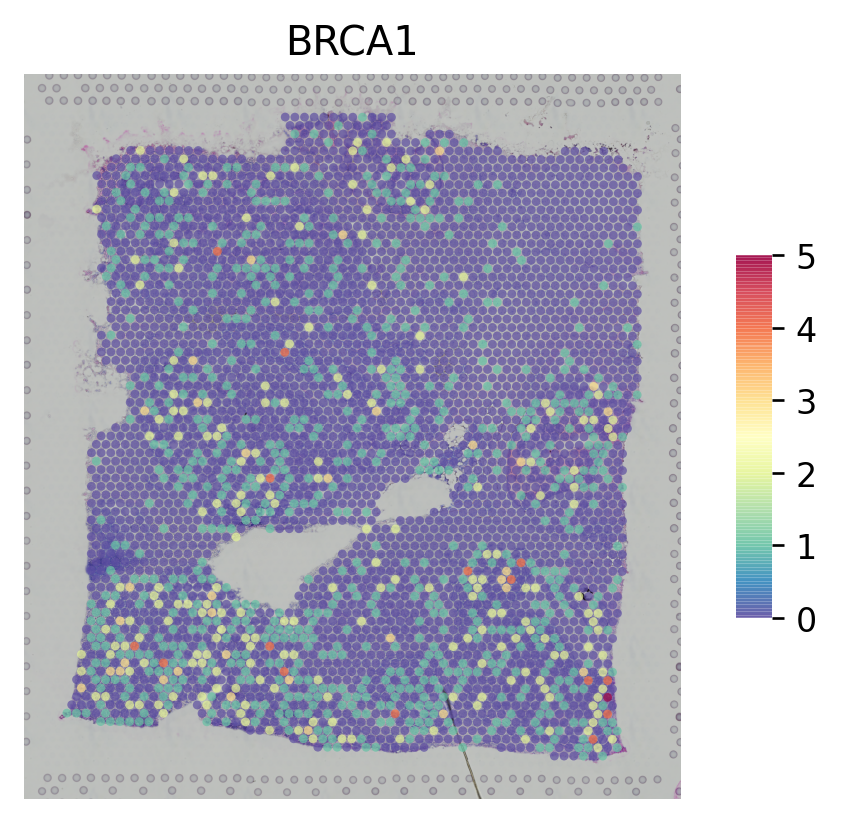

In [3]:
st.pl.gene_plot(adata, gene_symbols="BRCA1")

For multiple genes, you can combine multiple genes by `'CumSum'`cummulative sum or `'NaiveMean'`naive mean:

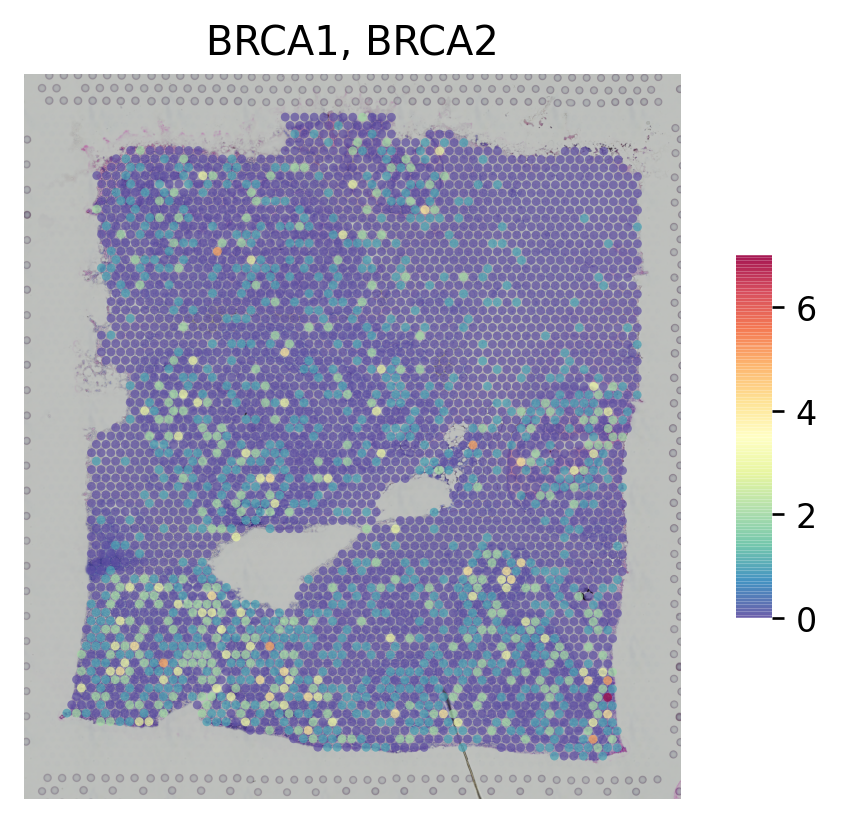

In [4]:
st.pl.gene_plot(adata, gene_symbols=["BRCA1","BRCA2"], method="CumSum")

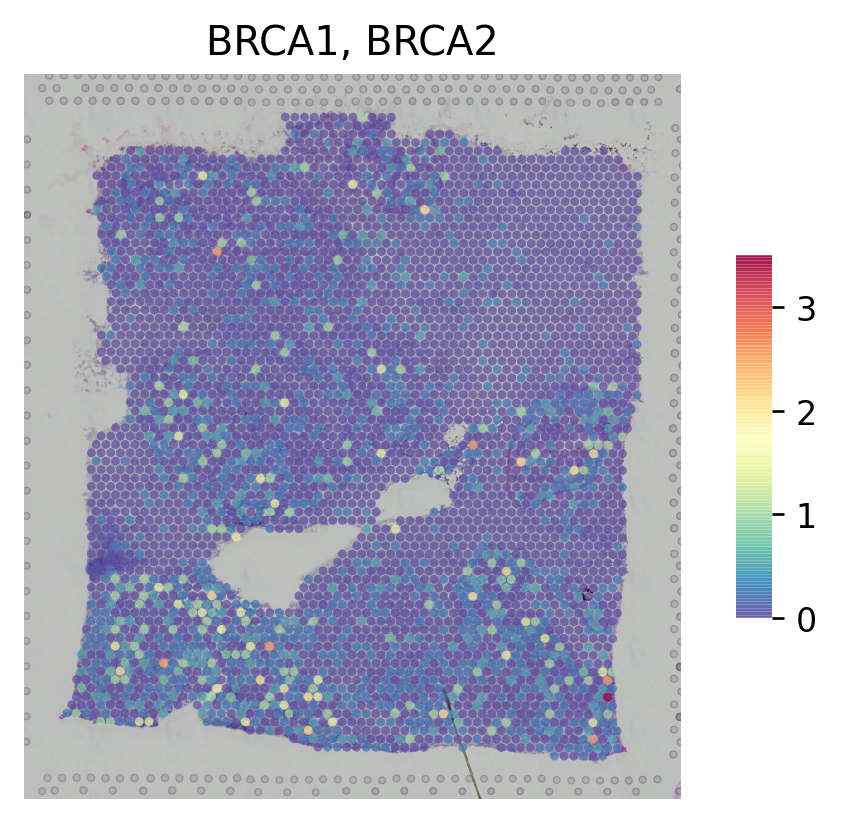

In [5]:
st.pl.gene_plot(adata, gene_symbols=["BRCA1","BRCA2"], method="NaiveMean")

You also can plot genes with contour plot to see clearer about the distribution of genes:

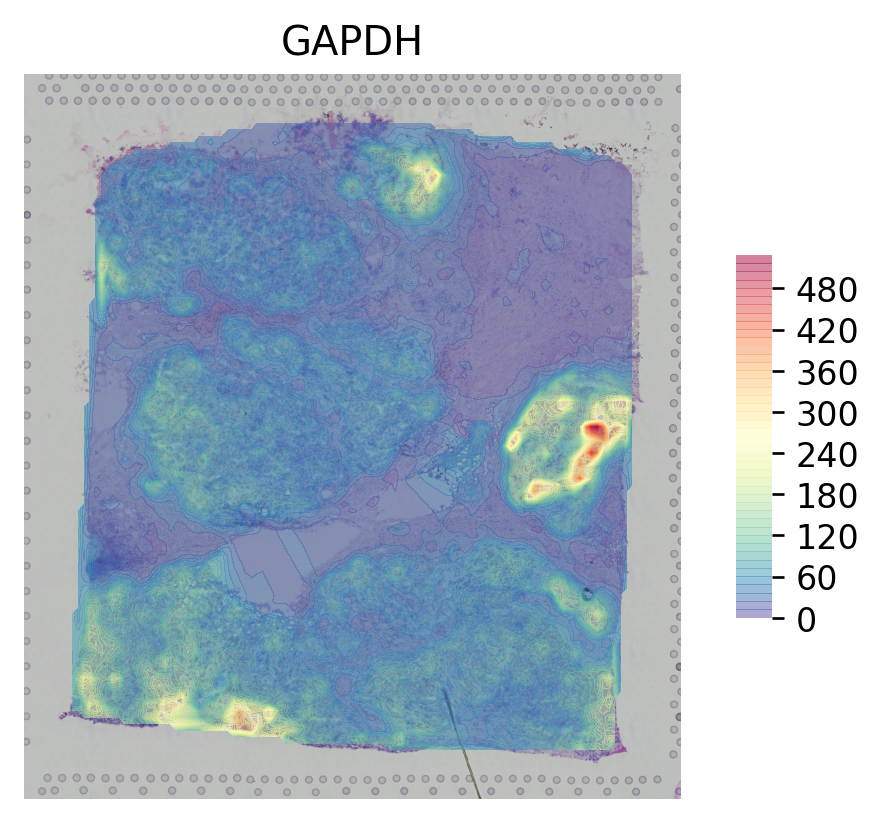

In [6]:
st.pl.gene_plot(adata, gene_symbols="GAPDH", contour=True,cell_alpha=0.5)

You can change the `step_size` to cut the range of display in contour

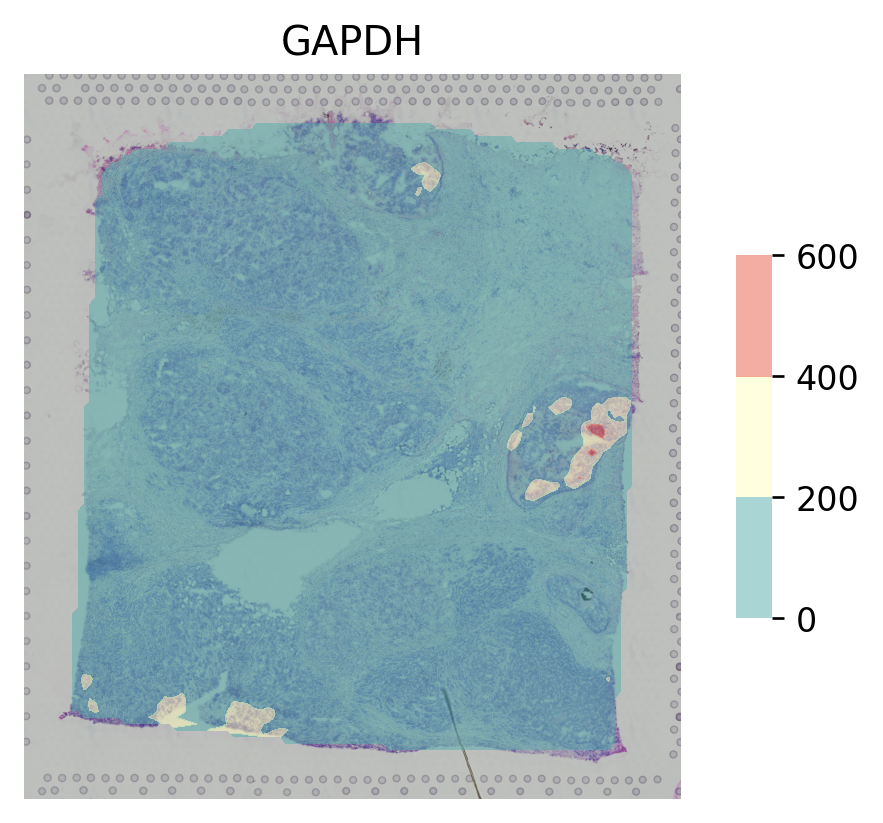

In [7]:
st.pl.gene_plot(adata, gene_symbols="GAPDH", contour=True,cell_alpha=0.5, step_size=200)

### Cluster plot

We provide different options for display clustering results. Several `show_*` options that user can control to display different parts of the figure:

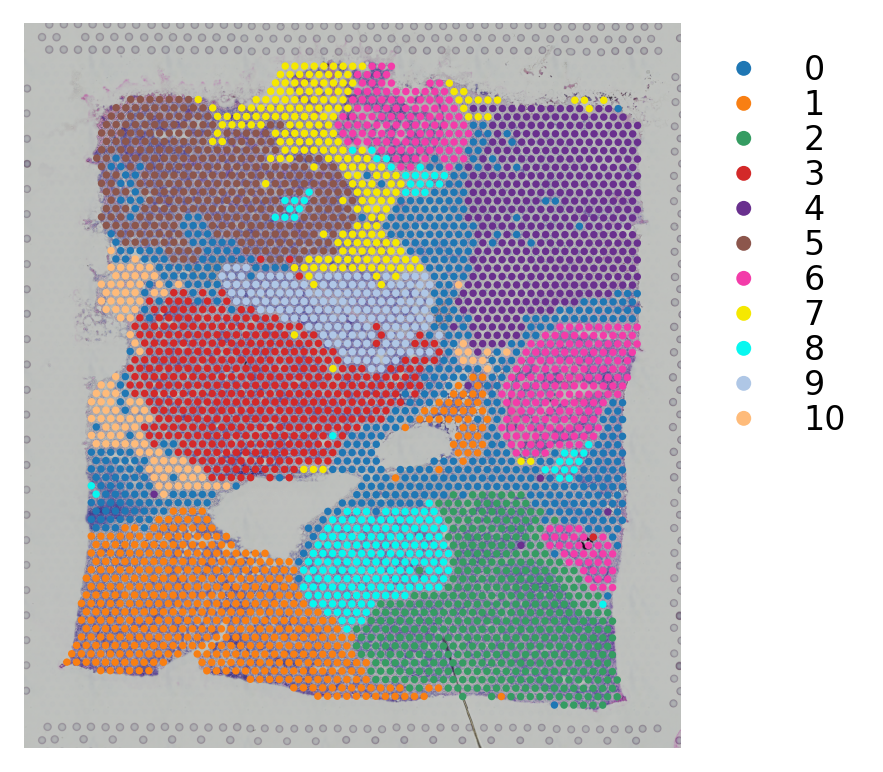

In [8]:
st.pl.cluster_plot(adata_processed,use_label="louvain")

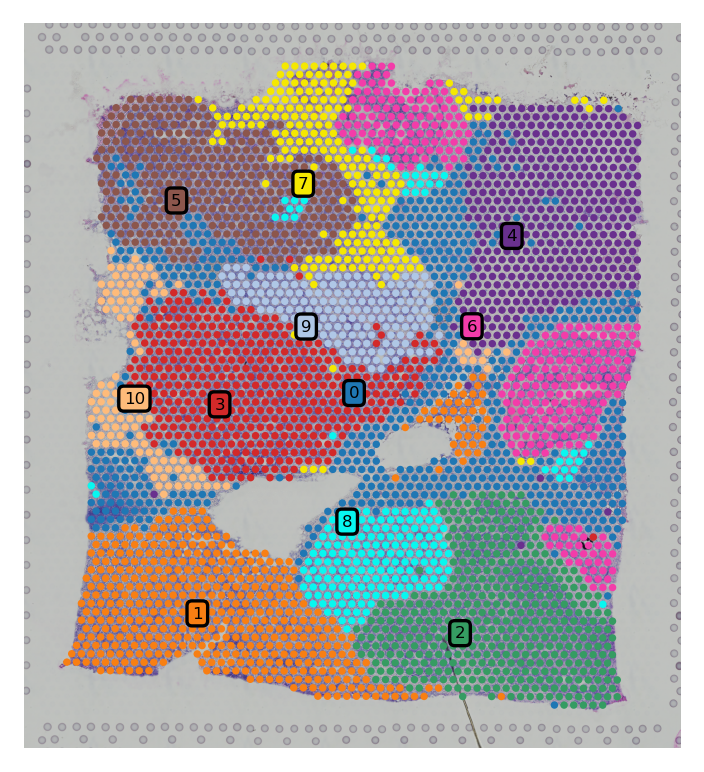

In [9]:
st.pl.cluster_plot(adata_processed,use_label="louvain",show_cluster_labels=True,show_color_bar=False)

### Subcluster plot

We also provide option to plot spatial subclusters based on the spatial location within a cluster.

You have two options here, display subclusters for multiple clusters using `show_subcluster` in `st.pl.cluster_plot` or use `st.pl.subcluster_plot` to display subclusters within a cluster but with different color.

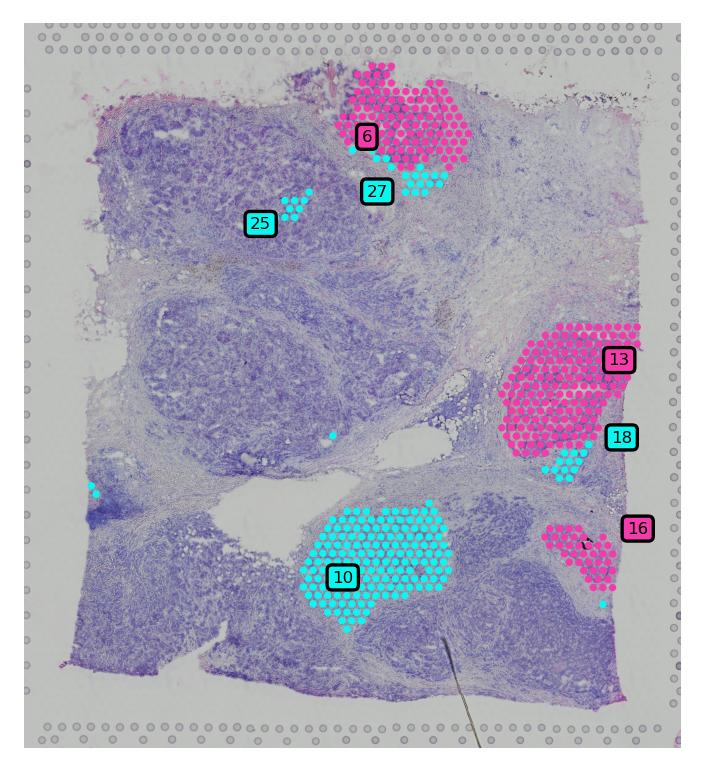

In [10]:
st.pl.cluster_plot(adata_processed,use_label="louvain",show_subcluster=True,show_color_bar=False, list_clusters=[6,8])

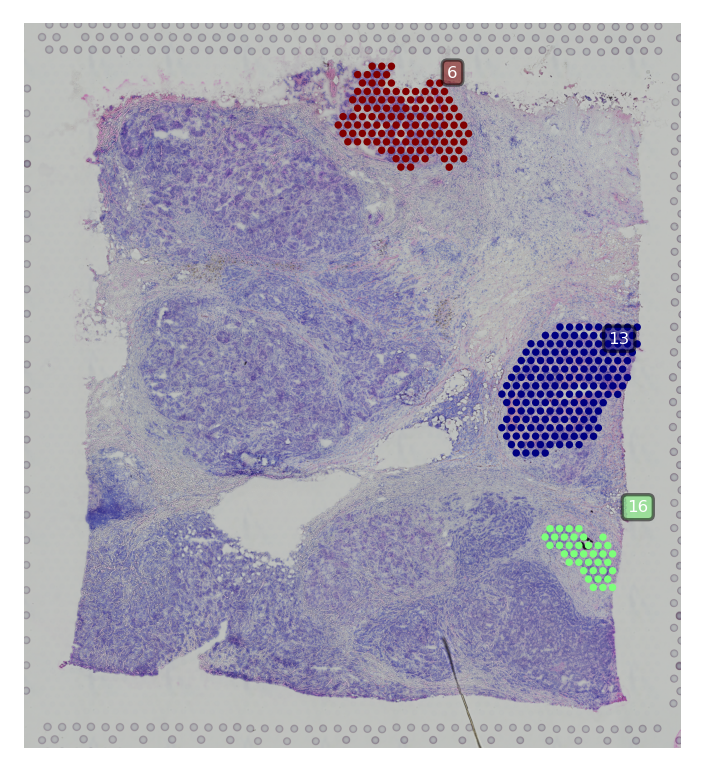

In [11]:
st.pl.subcluster_plot(adata_processed, use_label="louvain", cluster = 6)

### Spatial trajectory plot

We provided `st.pl.trajectory.pseudotime_plot` to visualize PAGA graph that maps into spatial transcriptomics array.

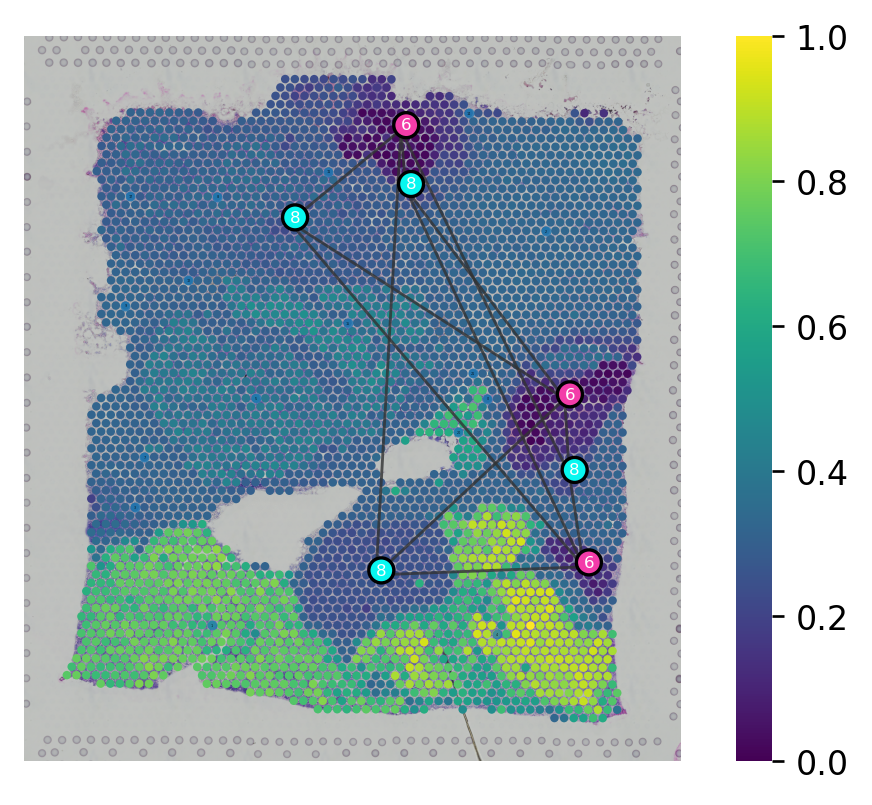

In [12]:
st.pl.trajectory.pseudotime_plot(adata_processed, use_label="louvain",show_node=T)

You can plot spatial trajectory analysis results with the node in each subcluster by `show_trajectories` and `show_node` parameters.

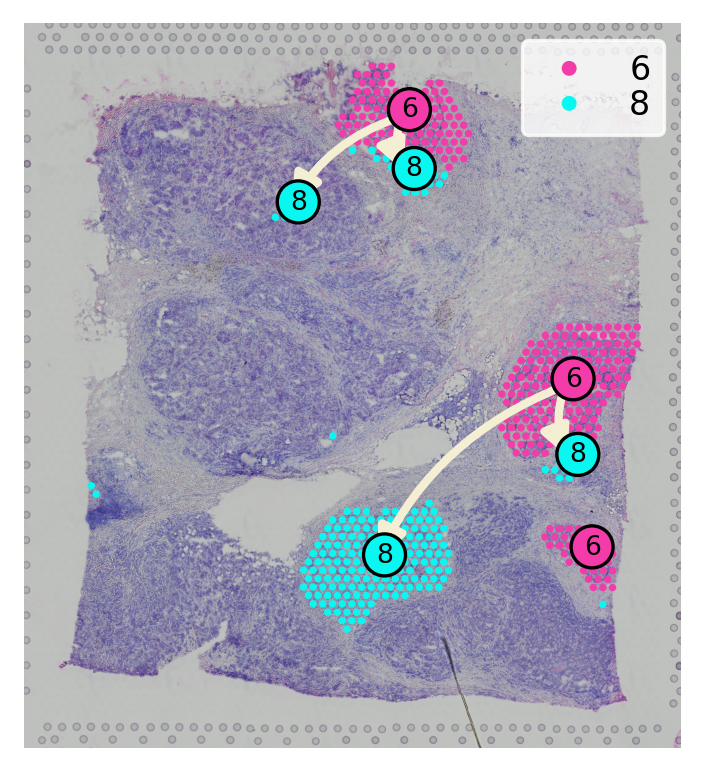

In [13]:
st.pl.cluster_plot(adata_processed,use_label="louvain",show_trajectories=True,
                   show_color_bar=True, list_clusters=[6,8], show_node=True)

### Cell-cell interaction plot

For the cell-cell interaction, you can display the result by `st.pl.het_plot`. We also provide an option to display the contour plot.

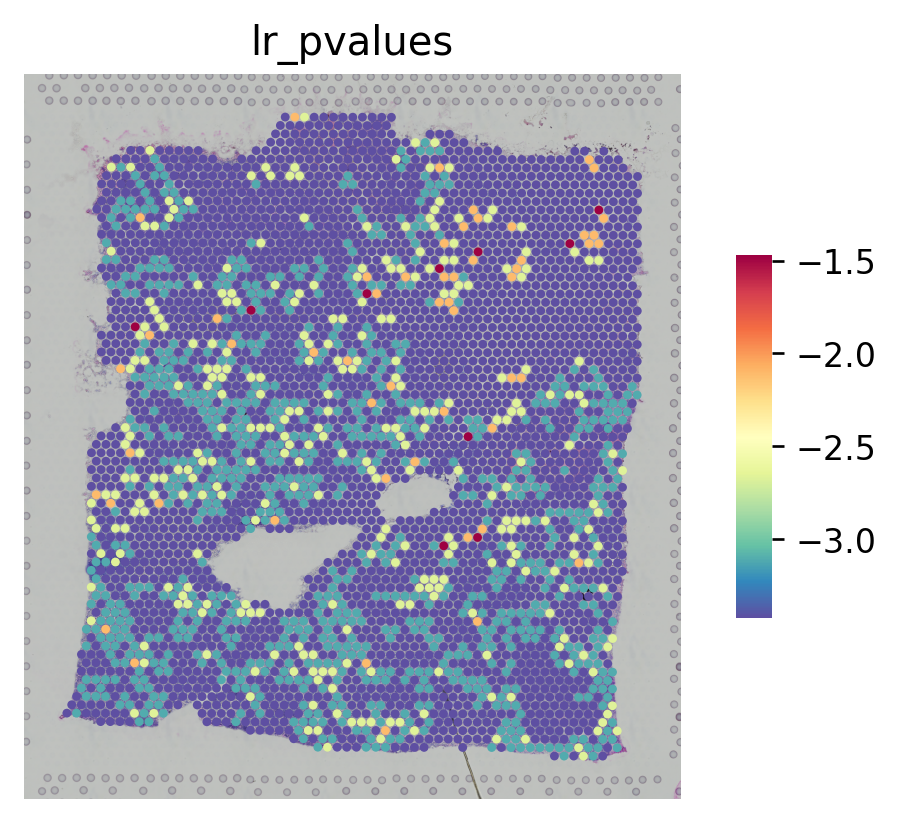

In [14]:
st.pl.het_plot(adata_processed, use_het="lr_pvalues")

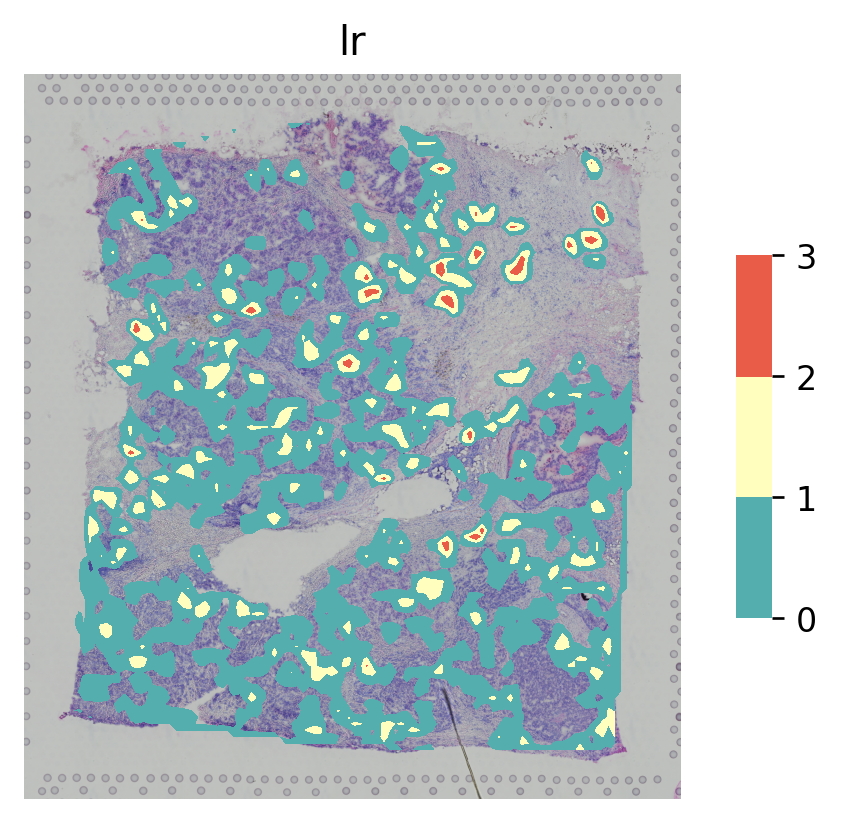

In [15]:
st.pl.het_plot(adata_processed, use_het="lr",contour=True,step_size=1)